# HOMEWORK 9

In this homework, you are going to use the dlib face detector and apply it to an image of your liking. You can follow the procedure shown in lesson 9. Please always comment your code so I can see what you're doing :-)

For this homework we are not going to provide you with any code, you'll have to build the face detector on your own.

### Step 0

Run the necessary imports.

In [126]:
import cv2
import numpy as np
import glob
import matplotlib.pyplot as plt
import seaborn as sns
import dlib
plt.rcParams['figure.figsize'] = [16,35]

### Step 1

Load an image (any image that contains faces).

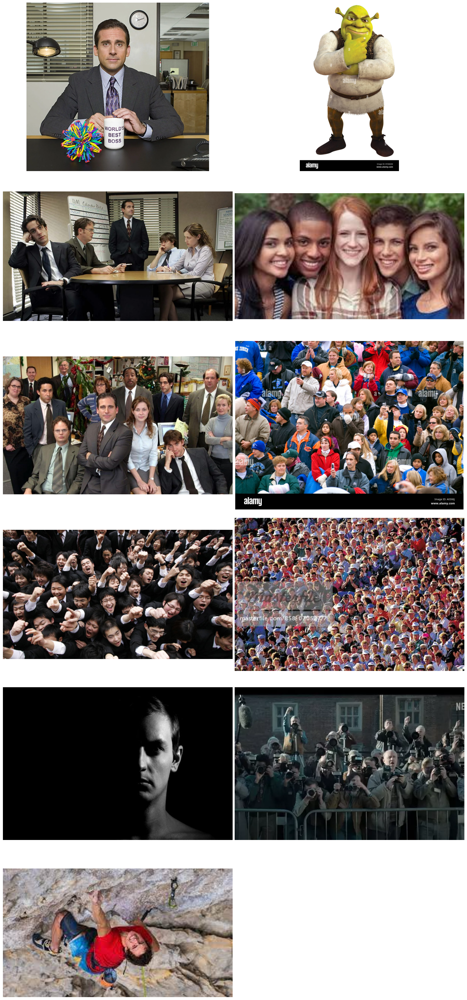

In [127]:
images = [cv2.imread(img) for img in glob.glob('images/*')]
images = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB) for img in images]
images_gray = [cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in images]

# Display the images 2 in a row
def display_images(images, transform=lambda x: x):
    rows, cols = (len(images)+1)//2, 2
    for i in range(len(images)):
        plt.subplot(rows, cols, i+1)
        plt.imshow(transform(images[i]))
        plt.axis('off')
    plt.tight_layout(pad=0.5, w_pad=0.5, h_pad=0.5)
    plt.show()

display_images(images)

### Step 2

Load the dlib face predictor.

In [128]:
detector = dlib.get_frontal_face_detector()

### Step 3

Run the predictor on your image.

In [129]:
det = detector(images[0], 1)
det

rectangles[[(617, 290) (884, 558)]]

### Step 4

Draw bounding boxes around the detected faces and plot the image. Use different colour for each face.

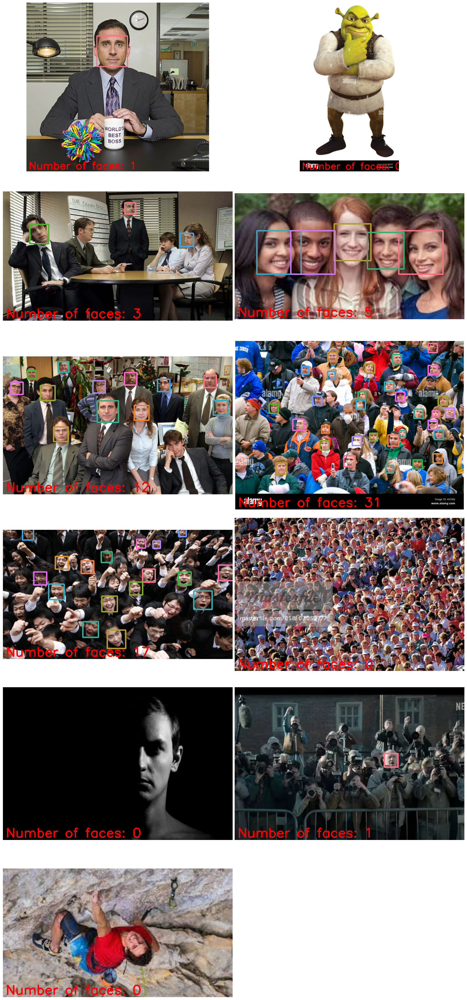

In [130]:
def dlib_detector(img):
    # make a copy draw on
    out = img.copy()
    # run the detector
    det = detector(out, 1)
    
    # rescale both image and detections for unified visualization
    scale = 800/np.max(out.shape[:2])
    out = cv2.resize(out, (int(out.shape[1]*scale), int(out.shape[0]*scale)))
    det = [dlib.rectangle(int(d.left()*scale), int(d.top()*scale), int(d.right()*scale), int(d.bottom()*scale)) for d in det]

    # Create a color palette for bounding boxes
    colors = sns.color_palette('husl', len(det))
    colors = np.array(colors) * 255

    # draw the detected bounding boxes and display the toatl number of detected faces
    for i, d in enumerate(det):
        cv2.rectangle(out, (d.left(), d.top()), (d.right(), d.bottom()), colors[i % len(colors)], 3)
    cv2.putText(out, f'Number of faces: {len(det)}', (10, out.shape[0]-10), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 0, 0), 3)
    return out

display_images(images, dlib_detector)

### Step 5 (optional)

Repeat the process with a different and more challenging image (more faces, smaller faces, people with glasses, hats, helmets, etc.). How does the detector perform? Is it robust?